<pre>Spis treści

1 Opis projektu  
2 Dane  
3 Analiza eksploracyjna  
    3.1 Czyszczenie danych  
    3.2 Przygotowanie połączenia z bazą dancyh  
    3.3 Funkcje wykorzystywane w projekcie  
    3.4 Zobrazowanie zebranych danych  
    3.5 Analiza cen  
        3.5.1 Przedziały cenowe  
        3.5.2 Cena w zależności od typu budynku  
    3.6 Analiza najwazniejszych parametrów mieszkania  
        3.6.1 Metraż  
        3.6.2 Najpopularniejsze piętro  
        3.6.3 Odległość od centrum  
        3.6.4 Liczba pokoi  
4 Badanie zależności danych  
    4.1 Macierz korelacji  
    4.2 Badanie zależności ceny od zmiennych, z którymi zaszła największa korelacja  
        4.2.1 Zależność ceny od odległości do centrum  
        4.2.2 Zależność ceny od odległości do najbliższej uczelni  
        4.2.3 Zależność ceny od odległości do najbliższej placówki medycznej  
        4.2.4 Zależność ceny od odległości do ilości punktów zainteresowania  
        4.2.5 Płaszczyzna regresji dla ceny, odległości od centrum i odległości od uczelni  
    4.3 Analiza ceny mieszkań na przestrzeni miesięcy  
        4.3.1 Wykres dla wszystkich typów mieszkań  
        4.3.2 Prosta regresji wraz z predykcją dla wszystkich typów mieszkań  
        4.3.3 Wykres dla bloków mieszkalnych i kamienic  
        4.3.4 Wykres dla wybranej grupy mieszkań w bloku mieszkalnym  
        4.3.5 Porównanie cen z sierpnia 2023 z cenami ze stycznia 2024  
5 Wnioski </pre>

1. Opis projektu

Celem projektu jest analiza cen zakupu mieszkań w Krakowie.

2. Dane

Dane zostały pozyskane ze strony: https://www.kaggle.com/datasets/krzysztofjamroz/apartment-prices-in-poland?select=apartments_rent_pl_2024_01.csv

Dane są w formacie csv i zawierają informacje o ofertach sprzedarzy, oraz wynajmu mieszkań z różnych mist w polsce, odpowiednio:
- zakup: od 8 sierpnia 2023 roku do 1 stycznia 2024 roku
- wynajmu: od 11 października 2023 roku do 1 stycznia 2024 roku

Warto dodać, że dane zawierają się w kilku plikach, z których każdy reprezentuje jeden miesiąc. Dane o sprzedarzy i wynajmie znajdowały się w różnych plikach.

Postanowiłem nie analizować cen wynajmu mieszkań, ponieważ w tym okresie będą one prawdopodobnie niższe z uwagi na mniejszy popyt na wynajem. Moim zdaniem do takiej analizy
potrzebne są dane zbierane przynajmniej przez pełne 12 miesięcy.

W zbiorze znajdują się oferty sprzedarzy mieszkań:
- w blokach mieszkalnych
- kamienicach

Kolumny znajdujące się w głównej tabeli:
-city
-type
-squareMeters
-rooms
-floor
-floorCount
-buildYear
-latitude
-longitude
-centreDistance
-poiCount
-schoolDistance
-clinicDistance
-postOfficeDistance
-kindergartenDistance
-restaurantDistance
-collegeDistance
-ownership
-buildingMaterial
-condition
-hasParkingSpace
-hasElevator
-hasSecurity
-hasStorageRoom
-price
-month
-year

3. Analiza eksploracyjna

3.1. Czyszczenie danych

Pobrane pliki zaimportowałem do bazy danych sqlite. Pierwszym krokiem było pozbycie się plików zawierających dane o wynajmie. Kolejnym krokiem było połączenie pozostałych plików, tak aby dostać tabelę zawierającą rekrody z całego dostępnego okresu. Następnie pozbyłem się danych dotyczących innych miast.

3.2 Przygotowanie połączenia z bazą danych

Przygotowanie połączenia z bazą danych oraz zaimportowanie modułów

In [43]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import folium
import branca.colormap as cm
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.dates as dates
import pingouin as pg


sqliteConnection = sqlite3.connect('projekt.db')
cursor = sqliteConnection.cursor()

3.3 Funkcje wykorzystywane w projekcie

In [44]:
#Pobiera kolunę var_name z bazy danych i zwraca dataFrame stworzony na jej podstawie
def fetchSingleColumn(var_name, condition=""):

    sqlQuery = "SELECT "+ var_name + " * 1.0 FROM Data " + condition
    cursor.execute(sqlQuery)
    result = cursor.fetchall()

    return pd.DataFrame(result, columns=[var_name])

#Pobiera cenę, miesiąc i rok, następnie zwraca stworzony dataFrame
def fetchPriceAndDate(condition=""):

    sqlQuery = "SELECT price * 1.0, month * 1.0, year * 1.0 FROM Data "+condition
    cursor.execute(sqlQuery)
    result = cursor.fetchall()

    return pd.DataFrame(result, columns=["price", "month", "year"])

#Liczy średnią kwotę dla danej daty i potem sortuje średnie po dacie rosnąco
def getAvgSortedDates(dataFrame):

    mean_prices = dataFrame.groupby(['year', 'month']).mean()['price'].reset_index()
    mean_prices['date'] = pd.to_datetime(mean_prices[['year', 'month']].assign(day=1))
    mean_prices['date_num'] = dates.date2num(mean_prices['date'])
    mean_prices = mean_prices.sort_values('date')
    return mean_prices

#Wykres jednej zmiennej od drugiej
def scatterPlot(x, y, title, xlabel, ylabel):

    plt.figure(figsize=(10, 6))
    plt.plot(x, y, marker='o', linestyle='-', color='blue')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

#Podwójny wykres jednej zmiennej od drugiej
def doubleScatterPlot(x1, y1, title1, xlabel1, ylabel1, x2, y2, title2, xlabel2, ylabel2):

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(x1, y1)
    plt.title(title1)
    plt.xlabel(xlabel1)
    plt.ylabel(ylabel1)

    plt.subplot(1, 2, 2)
    plt.plot(x2, y2)
    plt.title(title2)
    plt.xlabel(xlabel2)
    plt.ylabel(ylabel2)

    plt.tight_layout()
    plt.show()

#Rysuje potrójny histogram
def tripleHistogram(x1, title1, xlabel1, ylabel1,
                      x2, title2, xlabel2, ylabel2,
                      x3, title3, xlabel3, ylabel3, bins=30):
    
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 1)
    plt.hist(x1, bins=bins, edgecolor="black")
    plt.title(title1)
    plt.xlabel(xlabel1)
    plt.ylabel(ylabel1)

    plt.subplot(1, 3, 2)
    plt.hist(x2, bins=bins, edgecolor="black")
    plt.title(title2)
    plt.xlabel(xlabel2)
    plt.ylabel(ylabel2)

    plt.subplot(1, 3, 3)
    plt.hist(x3, bins=bins, edgecolor="black")
    plt.title(title3)
    plt.xlabel(xlabel3)
    plt.ylabel(ylabel3)


    plt.tight_layout()
    plt.show()
    

#Podaje podstawowe wskaźniki połorzenia i rozproszenia dla danej kolumny z bazy danych
def describeSingeColumnData(var_name):

    df = fetchSingleColumn(var_name)
    print("Wariancja: ", df[var_name].var())
    print("Odchylenie standardowe: ", df[var_name].std())
    desc = df.describe()
    print(desc)

#Rysuje histogram dla danej kolumny z bazy dancyh
def histogram(var_name, title, x_label, y_label, bins):

    df = fetchSingleColumn(var_name)

    plt.hist(df[var_name], bins=bins, edgecolor="black", )
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    plt.show()

#Rysuje trzy wykresy regresji, każdy o różnych wartościach metrażumm regpot korzysta z 95% przedziału ufności
def tripleRegression(var1, var2 = "price", var3="squareMeters"):

    sqlQuery = "SELECT "+var2+" * 1.0, "+var1+" * 1.0, "+var3+" * 1.0 FROM Data"
    cursor.execute(sqlQuery)
    result = cursor.fetchall()

    df = pd.DataFrame(result, columns=[var2, var1, var3])
    df = df.astype(float)

    _, axes = plt.subplots(1, 3, figsize=(15, 5))

    for i, ax in enumerate(axes.flatten(), start=3):

        selected_range = df[(df[var3] >= 20 + (10 * i) - 1) & (df[var3] <= 20 + (10 * i) + 1)]

        sns.regplot(x=var2, y=var1, data=selected_range, fit_reg=True, ax=ax, ci=95, line_kws={"color": "blue"})

        val = "Metraż w przedziale [" + str(20 + (10 * i) - 1) + ", " + str(20 + (10 * i) + 1) + "]"

        ax.set_title(val)
        
        ax.set_xlabel("Cena [zł]")
        ax.set_ylabel("Odległość [km]")

    plt.tight_layout()

    plt.show()

#Umieszcza punkty na mapie na podstawie współrzędnych geogeraficznych
def mapPrices(filename, condition=""):

    coordinates = "SELECT latitude * 1.0 , longitude * 1.0, price * 1.0 FROM Data " + condition
    cursor.execute(coordinates)
    result = cursor.fetchall()

    df = pd.DataFrame(result, columns=["latitude", "longitude", "price"])

    colormap = cm.LinearColormap(colors=['lightblue', 'blue', 'lightgreen', 'green', 'darkgreen', 'yellow', 'orange', 'red'], vmin=0, vmax=3000000)

    m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=13)

    for i in range(len(df)):
        folium.Circle(
            location=[df.iloc[i]['latitude'], df.iloc[i]['longitude']],
            radius=50,
            fill=True,
            color=colormap(df.iloc[i]['price']),
            fill_opacity=1
        ).add_to(m)

    m.add_child(colormap)
    m.save(filename)

#Wyliczanie korelacji, p-wartości i przedziałów ufności dla hipotezy alternatywnej: "korelacja jest różna od 0"
def pearsonr(var1, var2):

    sqlQuery = "SELECT "+var1+" * 1.0, "+var2+" * 1.0 FROM Data"
    cursor.execute(sqlQuery)
    result = cursor.fetchall()

    df = pd.DataFrame(result, columns=[var1, var2])
    result = pg.corr(df[var1], df[var2])

    print("Korelacja:", result['r'].values)
    print("P-wartość:", result['p-val'].values)
    print("Przedział ufności:", result['CI95%'].values)


3.4 Zobrazowanie zebranych danych

W bazie znajduje się 14699 ofert sprzedarzy mieszkań

In [47]:
records_count = "SELECT * FROM Data"
cursor.execute(records_count)
result = cursor.fetchall()

df = pd.DataFrame(result, columns=["id", "city", "type", "squareMeters", "rooms", "floor", "floorCount", "buildYear", "latitute",
                                   "longitude", "centreDistance", "poiCount", "schoolDistance", "clinicDistance", "postOfficeDistance",
                                   "kindergartenDistance", "restaurantDistance", "collegeDistance", "pharmacyDistance", "ownership", "buildingMaterial",
                                   "condition", "hasParkingSpace", "hasBalcony", "hasElevator", "hasSecurity", "hasStorageRoom", "price", "month", "year"])

print("Liczba ofert sprzedarzy:", df["id"].count())

Liczba ofert sprzedarzy: 14699


3.5 Analiza cen

3.5.1 Przedziały cenowe

Najważniejszym krokiem było sporządzenie histogramu cen mieszkań, aby dowiedzieć się z jakimi wartościami mamy do czynienia.

Analizując wykres oraz wskaźniki położenia i rozproszenia można wysnuć następujący wniosek. W Krakowie najwięcej mieszkań kupimy za kwotę od 500 tys. złotych do 1 mln. złotych. Największa zarejestrowana cena to aż 3 milionów złotych, a najtańsze
mieszkanie można było kupić za 255 tys. złotych.

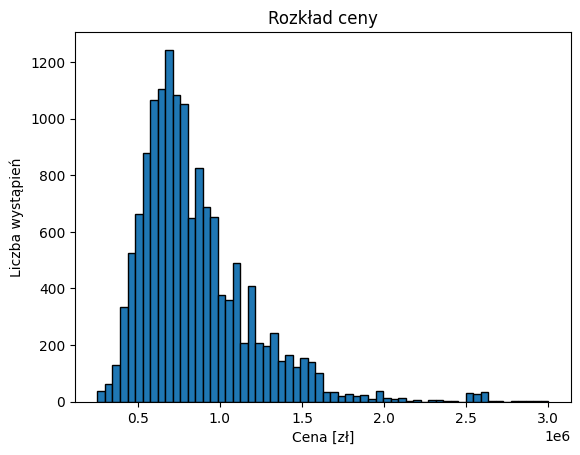

In [153]:
histogram("price", "Rozkład ceny", "Cena [zł]", "Liczba wystąpień", 60)

In [158]:
describeSingeColumnData("price")

Wariancja:  120948255128.89359
Odchylenie standardowe:  347776.1566423057
              price
count  1.469900e+04
mean   8.513836e+05
std    3.477762e+05
min    2.550000e+05
25%    6.200000e+05
50%    7.700000e+05
75%    9.890000e+05
max    3.000000e+06


3.5.2 Cena w zależności od typu budynku

Dane zawierają  trzy różne typy budynków:
- blockOfFlats
- apartmentBuilding
- tenement

Tenement odnosi się do kamienicy, natomiast zarówno block of flats jak i apartment building może oznaczać blok mieszkalny. Po sporządzeniu wykresu
ceny od typu budynku doszedłem do wniosku, że rozkład ceny dla blockOfFlats i apartmentBuilding jest bardzo podobny, więc być może takie nazewnictwo wynika z niedokładności
systemu stworzonego przez autora danych, który "scrapował" je z różnych stron aukcyjnych. Zatem na dalszą część projektu przyjmę, że oba określenia odnoszą się do bloku mieszkalnego.

Zauwazyć można wzrost w cenie kamienic w stosunku do pozostałych kategorii.

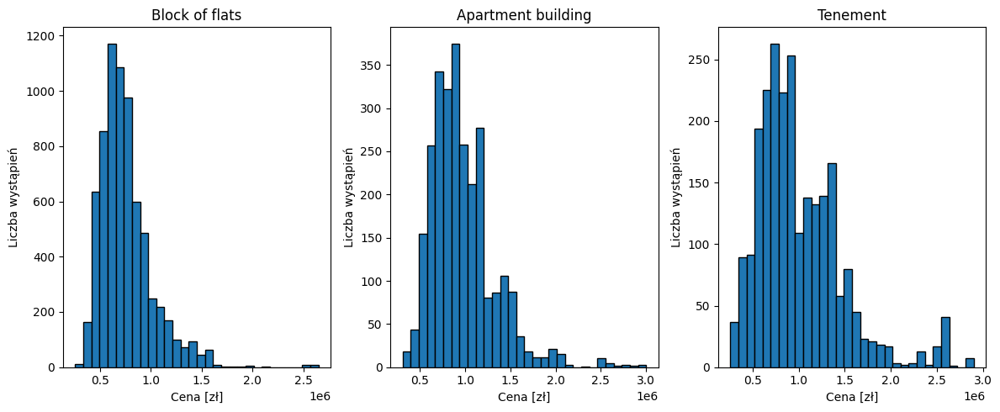

In [41]:
df1 = fetchSingleColumn(var_name="price", condition="WHERE type = 'blockOfFlats'")
df2 = fetchSingleColumn(var_name="price", condition="WHERE type = 'apartmentBuilding'")
df3 = fetchSingleColumn(var_name="price", condition="WHERE type = 'tenement'")

tripleHistogram(df1, "Block of flats", "Cena [zł]", "Liczba wystąpień",
                df2, "Apartment building", "Cena [zł]", "Liczba wystąpień",
                df3, "Tenement", "Cena [zł]", "Liczba wystąpień")

3.6. Analiza najwazniejszych parametrów mieszkania

3.6.1. Metraż

Poniżej znajduje się histogram przedstawiający rozkład danych dotyczących metrarzu mieszkania. Jak można zauważyć na wykresie, w sprzedarzy
było najwięcej mieszkań o powierzchni ok. 50-60 m^2. Potwierdza to odczyt średniej = 58.0 oraz mediany = 53.0. Najmniejsze wystawione mieszkanie miało powierzchnię 25 m^2, a największe 150 m^2.

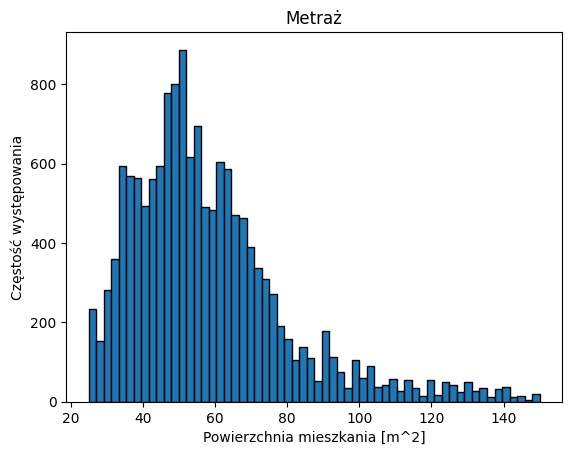

In [159]:
histogram("squareMeters", "Metraż", "Powierzchnia mieszkania [m^2]", "Częstość występowania", 60)

In [160]:
describeSingeColumnData("squareMeters")

Wariancja:  484.8495695617767
Odchylenie standardowe:  22.019299933507803
       squareMeters
count  14699.000000
mean      58.179001
std       22.019300
min       25.000000
25%       43.055000
50%       53.970000
75%       67.500000
max      150.000000


3.6.2 Najpopularniejsze piętro

Najczęściej sprzedawane były mieszkania na pierwszym piętrze oraz na parterze. Zdecydowanie trudniej kupić mieszkanie od 5 piętra w zwyż. Zapewne wynika to z tego, że większość bloków mieszkalnych zwyczajnie nie jest tak wysoka.

W bazie danych znajduje się kolumna floorCount pozwalająca, dla każdego wystawionego mieszkania dowiedzieć się ile pięter ma blok/kamienica w którym się ono znajduje.
Na podstawie wykresu mogę potwierdzić moją hipotezę z poprzedniego podpunktu. 

Można zauważyć, że peak na wykresie występuje dla mieszkań 4 piętrowych. Moim zdaniem wynika to z tego, że bloki mieszkalne, które mają <= 4 piętra mogą być budowane bez windy, co znacznie zmniejsza koszt budowy i z tego powodu, większość deweloperów decyduje się na takie rozwiązanie.

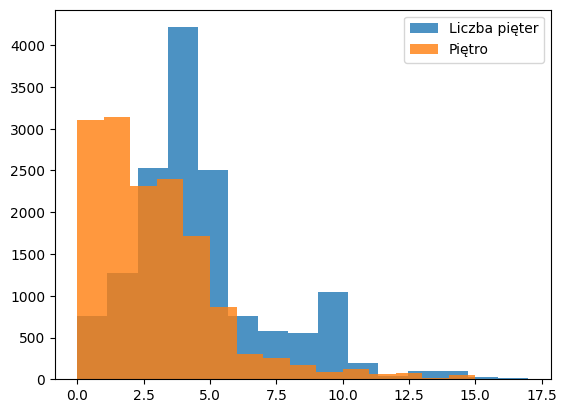

Wariancja:  5.623227234368
Odchylenie standardowe:  2.3713344838651507
              floor
count  14699.000000
mean       2.439077
std        2.371334
min        0.000000
25%        1.000000
50%        2.000000
75%        4.000000
max       15.000000


Wariancja:  6.943965287524871
Odchylenie standardowe:  2.6351404682720183
         floorCount
count  14699.000000
mean       4.727737
std        2.635140
min        0.000000
25%        3.000000
50%        4.000000
75%        5.000000
max       17.000000


In [23]:
plt.hist(fetchSingleColumn(var_name="floorCount"), label='Liczba pięter', alpha=0.8, bins=15)
plt.hist(fetchSingleColumn(var_name="floor"), label='Piętro', alpha=0.8, bins=15)
plt.legend()
plt.show()
describeSingeColumnData("floor")
print("")
describeSingeColumnData("floorCount")

3.6.3 Odległość od centrum

Średnia odległość od centrum to ok. 4 km. W zestawieniu znalazły się oferty sprzedaży mieszkanie w centrum, a także takie odległe o 10 km.

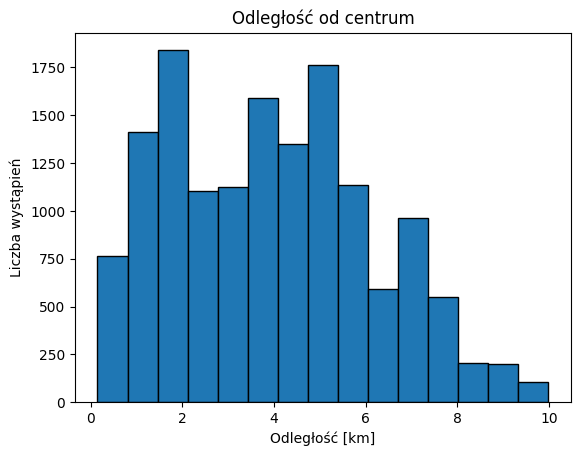

In [165]:
histogram("centreDistance", "Odległość od centrum", "Odległość [km]", "Liczba wystąpień", 15)

In [166]:
describeSingeColumnData("centreDistance")

Wariancja:  4.859836849833884
Odchylenie standardowe:  2.2045037649851915
       centreDistance
count    14699.000000
mean         3.954358
std          2.204504
min          0.150000
25%          1.940000
50%          3.840000
75%          5.420000
max          9.990000


3.6.4 Liczba pokoi

Najczęściej można było zakupić mieszkanie 2-3 pokojowe. W zestawieniu znalazło się nieco poniżej 1000 kawalerek. Zdecydowanie mniej popularne są mieszkanie 4, 5 i 6 pokojowe.

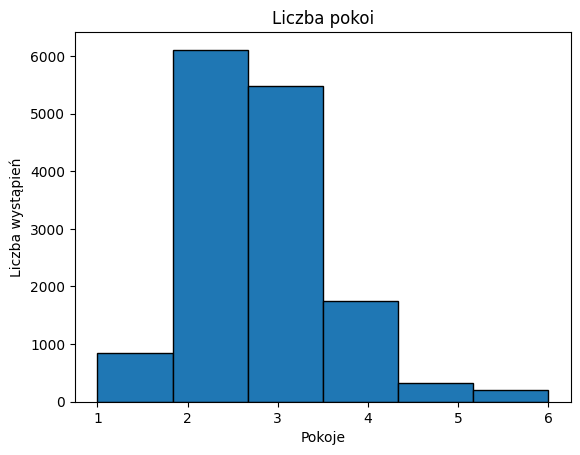

In [170]:
histogram("rooms", "Liczba pokoi", "Pokoje", "Liczba wystąpień", 6)

In [171]:
describeSingeColumnData("rooms")

Wariancja:  0.8712564517886573
Odchylenie standardowe:  0.9334111911631751
              rooms
count  14699.000000
mean       2.675556
std        0.933411
min        1.000000
25%        2.000000
50%        3.000000
75%        3.000000
max        6.000000


4. Badanie zależności danych

4.1 Macierz korelacji

Przygotowałem macierz korelacji ceny z najbardziej interesującymi mnie danymi:

- Cena za metr kwadratowy
- Ilość metrów kwadratowych
- Liczba pokoi
- Piętro
- Liczba pięter w bloku
- Rok wybudowania
- Odległość od Rynku Głownego
- Liczba punktów zainteresowania (Sklepów, kawiarni, ...)
- Odległość od najbliższej szkoły
- Odległość od najbliższej placówki medycznej
- Odległość od poczty 
- Odległość od przedszkola
- Odległość od restauracji
- Odległość od uczelni wyższej
- Odległość od apteki
- Czy posiada miejsce parkingowe
- Czy posiada balkon
- Czy posiada windę
- Czy podsiada ochronę
- Czy posiada piwnicę / schowek

Po przeprowadzeniu obserwacji wyróżniłem kilka zmiennych, które można podejrzewać, że mają największy wpływ na cenę: metraż mieszkania, liczba pokoi, odległość od centrum, liczba punktów zainteresowania w okolicy oraz odległość od uczelni i placówki medycznej.

Zaskakujący dla mnie jest brak korelacji pomiędzy ceną, a rokiem budowy.

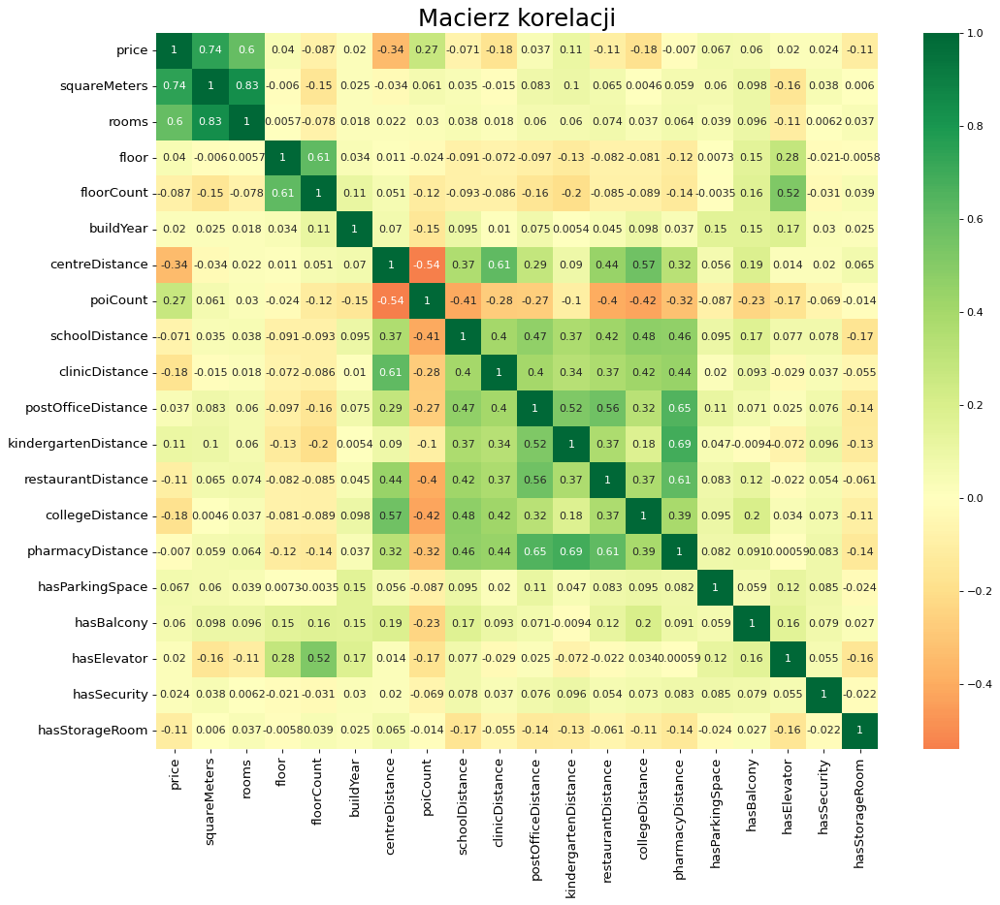

In [42]:
data = '''SELECT price * 1.0, squareMeters * 1.0, rooms * 1.0, floor * 1.0, floorCount * 1.0, buildYear * 1.0,
centreDistance * 1.0, poiCount * 1.0, schoolDistance * 1.0, clinicDistance * 1.0, postOfficeDistance * 1.0, kindergartenDistance * 1.0,
restaurantDistance * 1.0, collegeDistance * 1.0, pharmacyDistance * 1.0, 
IIF(hasParkingSpace='yes', 1, 0),
IIF(hasBalcony='yes', 1, 0),
IIF(hasElevator='yes', 1, 0),
IIF(hasSecurity='yes', 1, 0),
IIF(hasStorageRoom='yes', 1, 0)
FROM Data'''

cursor.execute(data)
result = cursor.fetchall()

df = pd.DataFrame(result, columns=["price", "squareMeters", "rooms", "floor", "floorCount", "buildYear", "centreDistance", "poiCount",
"schoolDistance", "clinicDistance", "postOfficeDistance", "kindergartenDistance", "restaurantDistance", "collegeDistance", "pharmacyDistance",
"hasParkingSpace", "hasBalcony", "hasElevator", "hasSecurity", "hasStorageRoom"])

df = df.astype(float)

import seaborn as sns
plt.figure(figsize=(15,12), dpi= 80)
sns.heatmap(df.corr(), xticklabels=df.corr().columns, yticklabels=df.corr().columns, cmap='RdYlGn', center=0, annot=True)

plt.title('Macierz korelacji', fontsize=22)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

4.2 Badanie zależności ceny od zmiennych, z którymi zaszła największa korelacja

4.2.1 Zależność ceny od odległości do centrum

Odczytana warość współczynnika korelacji to -0.34. Żeby najlepiej zobrazować sobie tą zależność skorzystałem z dołączonych wpółrzędnych geograficznych każdego miszkania naniosłem ceny na mapę Krakowa. Jak się okazuje zależnośc jest jak najbardziej zachodzi i jest to bardzo silna zależność. Mieszkanie w ścisłym centrum kupimy za od 2.5 mln do 3mln złotch, na obrzeżach od ok. miliona do dwóch. Z mapki wynika także, że najdroższymi dzielnicami Krakowa są: Stare Miasto, Grzegórzki, Podgórze, Krowodrza oraz Zwierzyniec. Najtańsze mieszkania kupimy na Nowej Hucie i Bieżanowie.

In [98]:
mapPrices("avgPrice.html")

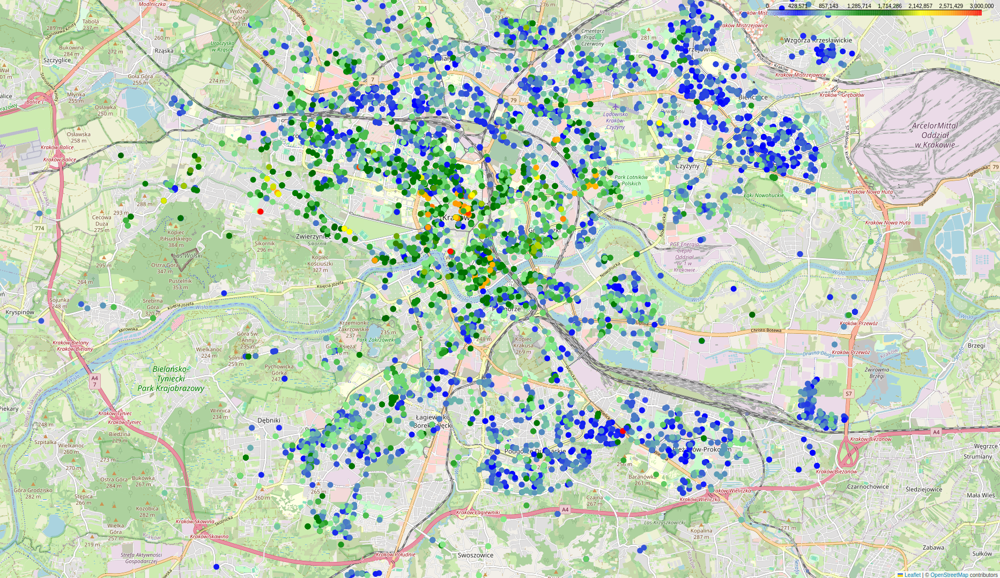

Stawiam hipotezę alternatywną: "Korelacja jest różna od 0". Wyliczona p watość potwierdza istnienie zależności. Nie jest ona równa 0 tylko bardzo mała.

In [45]:
pearsonr("price", "centreDistance")


Korelacja: [-0.34233804]
P-wartość: [0.]
Przedział ufności: [array([-0.36, -0.33])]


4.2.2 Zależność ceny od odległości do najbliższej uczelni

Na podstawie odczytanego współczynnika korelacji, który wynosił -0.18, postanowiłem dalej zbadać tę zależność. Z uwagi na dużą rozbieżność cenową w poniższych podpunktach zdeycdowałem się na wybranie 3 grup tj. mieszkań o metrażu zbliżonym do średniej, metrażu o 10 m^2 mniejszym od średnie i metrażu o 10 m^2 większym od średniej.

Z wgenerowanych wykresów wykresów można dowiedzieć się, że blisko uczelni kupimy mieszkanie w każdej półce cenowej. Natomiast widać trend, że te droższe mieszkania są ulokowane coraz bliżej tych placówek. Jednak wynikać to może z tego, że znaczna część krakowskich uczelni jest usytuowana w okolicach Rynku Głównego. Przykładem może być chociażby AGH. Myślę, że korelacja zachodzi, ale dużo mniejsza tak jak wskazuje współczynnik korelacji.

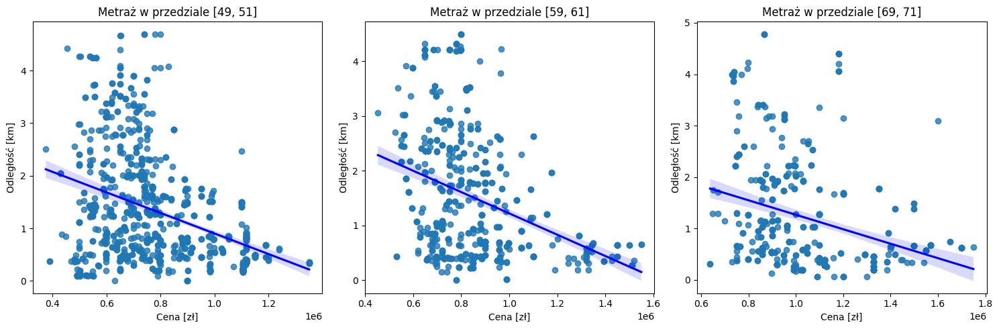

In [183]:
tripleRegression(var1="collegeDistance")


Stawiam hipotezę alternatywną: "Korelacja jest różna od 0". Wyliczona p watość potwierdza istnienie zależności.

In [46]:
pearsonr("price", "collegeDistance")

Korelacja: [-0.18321098]
P-wartość: [3.90454903e-111]
Przedział ufności: [array([-0.2 , -0.17])]


4.2.3 Zależność ceny od odległości do najbliższej placówki medycznej

Podobnie jak powyżej współczynnik korelacji wyniósł -0.18, więc można się spodziewać zależności.

W tym wypadku zależnośc jest znacznie mniej widoczna, wraz z wzrostem ceny, prosta regresji zbiega do linii poziomej w bardzo szybkim tempie. Na podstawie zebrancyh danych nie można jasno weskazać takiej korelacji.

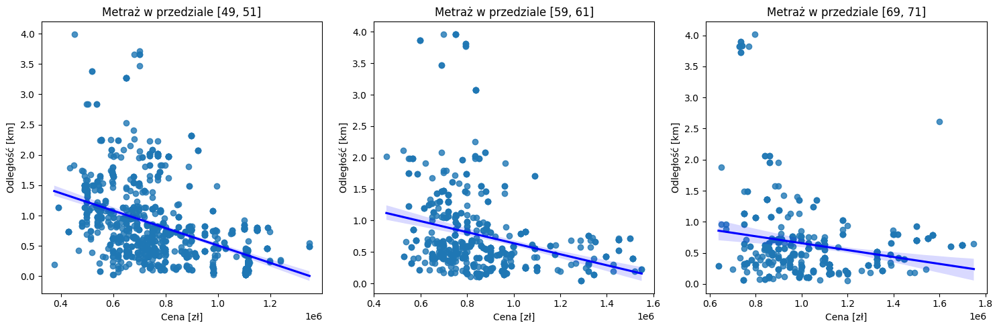

In [30]:
tripleRegression(var1="clinicDistance")

Stawiam hipotezę alternatywną: "Korelacja jest różna od 0". Wyliczona p watość potwierdza istnienie zależności.

In [47]:
pearsonr("price", "clinicDistance")

Korelacja: [-0.17599662]
P-wartość: [1.42932354e-102]
Przedział ufności: [array([-0.19, -0.16])]


4.2.4 Zależność ceny od odległości do ilości punktów zainteresowania

Ponownie widać lekką zależność. Zdecydowana mieszkania są zdecydowanie droższe wraz z wzrostem liczby punktów zainteresowania. Warto zwrócić uwagę, że zarówno dla ilościi punktów zainteresowania, odległości od szkoly, czy placówki medycznej zachodzi silna korelacja z odległością od centrum. 

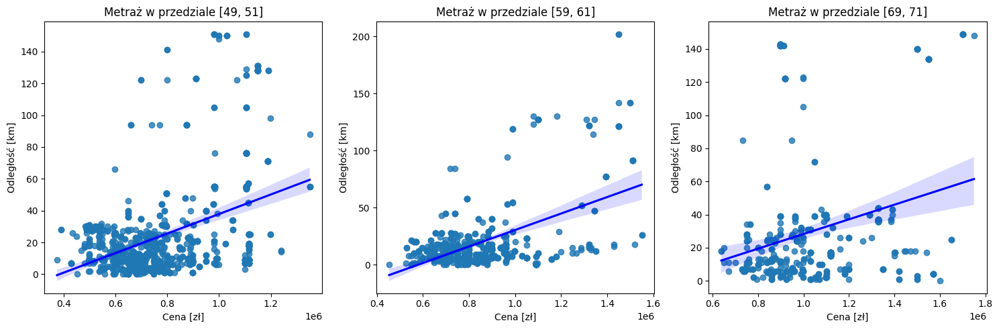

In [187]:
tripleRegression(var1="poiCount")

Stawiam hipotezę alternatywną: "Korelacja jest różna od 0". Wyliczona p watość potwierdza istnienie zależności.

In [48]:
pearsonr("price", "squareMeters")

Korelacja: [0.74356721]
P-wartość: [0.]
Przedział ufności: [array([0.74, 0.75])]


4.2.5 Płaszczyzna regresji dla ceny, odległości od centrum i odległości od uczelni

Zauważając korelację pomiędzy tymi zmiennymi postanowiłem spróbować umieścić je wszystkie na wykresie. Z wykresu napewno można się dowiedzieć, że odległość od uczelni wzrasta wraz z odległością od centrum. Ale także widać taką zależność, że cena maleje wraz ze wzrostem odległości od obu obiektów.

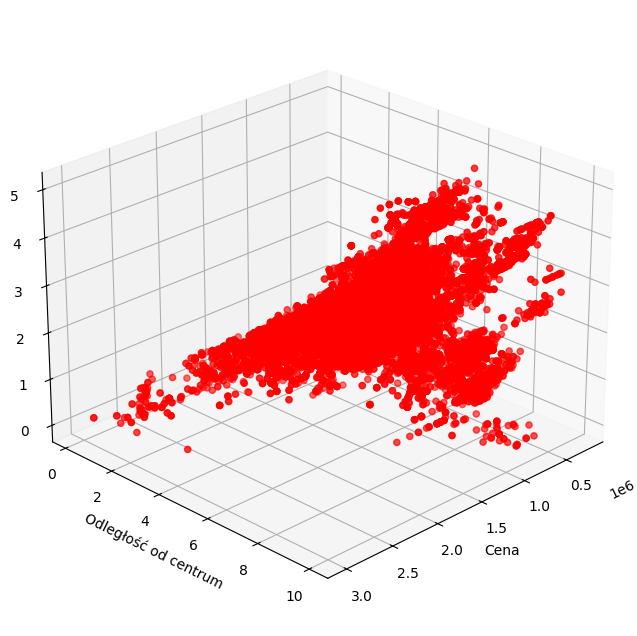

In [52]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

sqlQuery = "SELECT price * 1.0, centreDistance * 1.0, collegeDistance * 1.0 FROM Data "
cursor.execute(sqlQuery)
result = cursor.fetchall()
df = pd.DataFrame(result, columns=["price", "centreDistance", "collegeDistance"])

x = df["price"].values
y = df["centreDistance"].values
z = df["collegeDistance"].values

x = np.squeeze(x)
y = np.squeeze(y)
z = np.squeeze(z)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(x, y, z, c='r', marker='o')

ax.set_xlabel("Cena")
ax.set_ylabel("Odległość od centrum")
ax.set_zlabel("Odległość od uczelni")

ax.view_init(elev=25, azim=45)

plt.show()


4.3. Analiza ceny mieszkań na przestrzeni miesięcy

Następnie postanowiłem sprawdzić stabilność cen mieszkań.

4.3.1 Wykres dla wszystkich typów mieszkań

Wyniki obserwacji pokazują, że ceny znacznie urosły w ostatnim kwartale 2023.

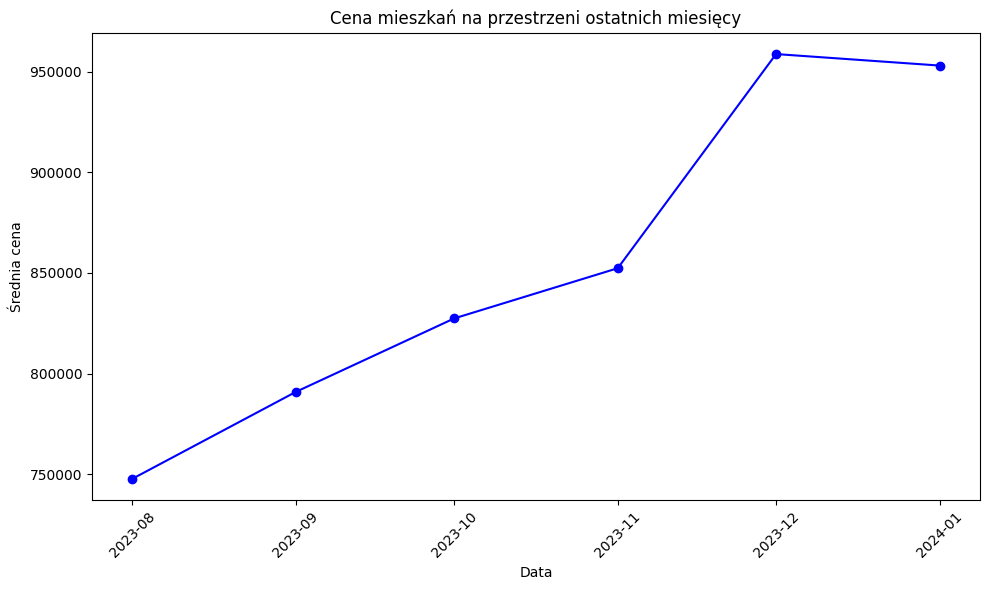

In [46]:
df = fetchPriceAndDate()
mean_prices = getAvgSortedDates(df)
scatterPlot(mean_prices["date"],  mean_prices["price"], "Cena mieszkań na przestrzeni ostatnich miesięcy", "Data", "Średnia cena")

4.3.2 Prosta regresji wraz z predykcją dla wszystkich typów mieszkań

Biorąc pod uwagę rezultaty poprzedniej analizy postanowiłem wyznaczyć prostą regresji i zastanowić się jak ceny mogą kształtować się w następnych 3 miesiącach 2024 roku.
Jak można zauważyć, na podstawie przedłużenia prostej regresji można przewidywać, że w marcu 2024 roku średnia cena miaszania w Krakowie osiągnie pułap ok. 1.05 mln, a już w sierpniu ok. 1.2 mln złotych.

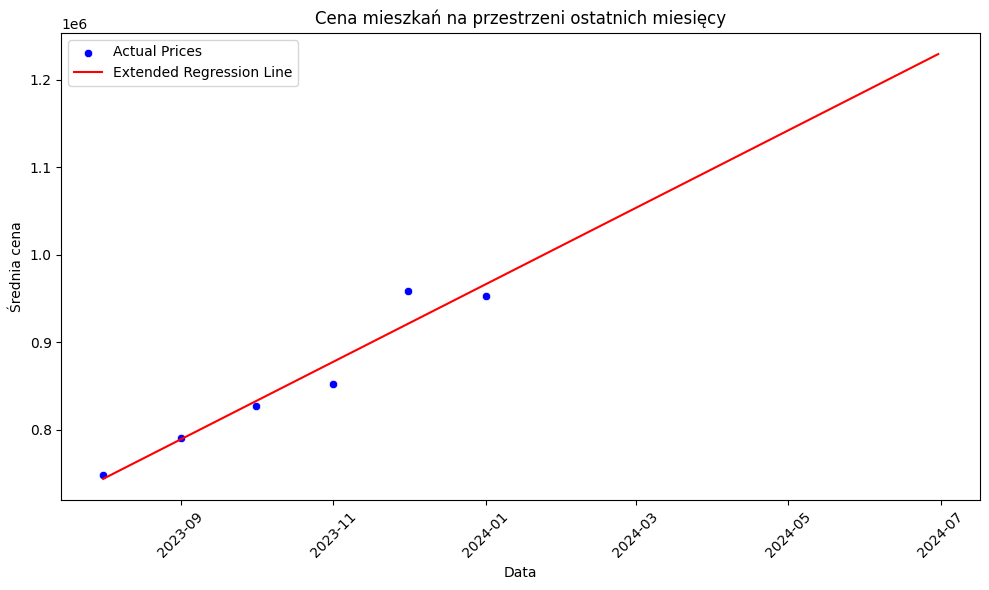

In [55]:
df = fetchPriceAndDate()
mean_prices = getAvgSortedDates(df)

regression_coefficients = np.polyfit(mean_prices['date_num'], mean_prices['price'], deg=1)
regression_line = np.poly1d(regression_coefficients)
future_dates = pd.date_range(start=mean_prices['date'].max(), periods=6, freq='M')
all_dates = pd.concat([mean_prices['date'], pd.Series(future_dates)])
all_dates_num = dates.date2num(all_dates)
all_prices = regression_line(all_dates_num)

plt.figure(figsize=(10, 6))
sns.scatterplot(x='date', y='price', data=mean_prices, color='blue', marker='o', label='Actual Prices')

plt.plot(all_dates, all_prices[:len(all_dates)], color='red', linestyle='solid', label='Extended Regression Line')
plt.title('Cena mieszkań na przestrzeni ostatnich miesięcy')
plt.xlabel('Data')
plt.ylabel('Średnia cena')
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend()
plt.show()


4.3.3 Wykres dla bloków mieszkalnych i kamienic

Z powodu uzyskania ciekawych rezultatów, zacząłem zastanawiać się jaku udział w cenie mają poszczególne typy mieszkań. Poniżej znajduje się wykres uwzględniający tylko cenę za mieszkanie w bloku praz taki uwzględniający mieszkanie tylko w kamienicy. Zaskakujący jest fakt, że wykresy wyglądają niemal identycznie. Można się z nich dowiedzieć, że w sierpniu średnia cena mieszkania w bloku wynosiła 725 tys. złotych, w peaku 900 tys. złotych, a w styczniu nieco poniżej tej kwoty. Natomiast kamienicy na początku 850 tys. w peaku 1.25 mln. złotych, a teraz powoli spada do 1.2 mln. złotych.

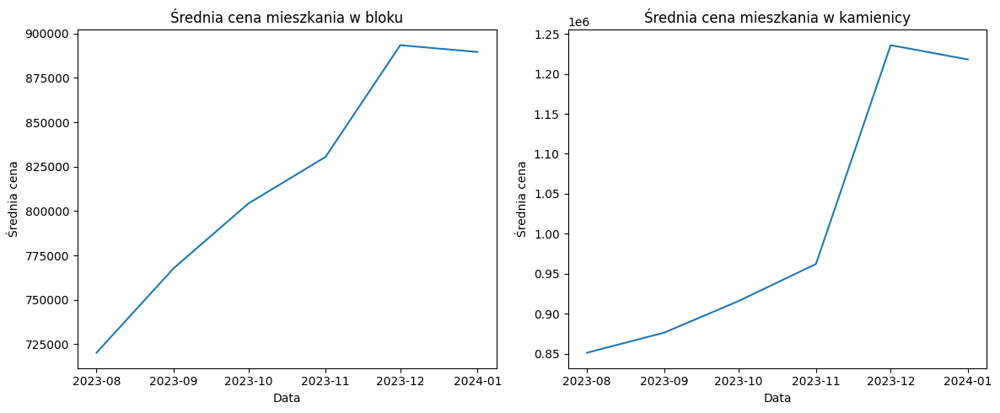

In [77]:
df_flat = fetchPriceAndDate(condition="WHERE (type = 'blockOfFlats' OR type = 'apartmentBuilding')")
mean_prices_flat = getAvgSortedDates(df_flat)

df_tenement = fetchPriceAndDate(condition="WHERE type = 'tenement'")
mean_prices_tenement = getAvgSortedDates(df_tenement)

doubleScatterPlot(mean_prices_flat['date'], mean_prices_flat['price'], "Średnia cena mieszkania w bloku", "Data", "Średnia cena",
                   mean_prices_tenement['date'], mean_prices_tenement['price'], "Średnia cena mieszkania w kamienicy", "Data", "Średnia cena")

4.3.4 Wykres dla wybranej grupy mieszkań w bloku mieszkalnym

W kolejnym kroku chciałem uzyskać nieco bardziej miarodajny wykres, dlatego porównałem mieszkania o podobnych parametrach. Wybrałem te, które w mojej
opinii mają największy wpływ na cenę mieszkania, a więc mieszkanie 2 lub 3 pokojowe o metrazu ok 54 m^2 oraz położone w średniej podobnej odległości od centrum (ok. 4km). W zestawieniu pominąłem kamienice. 

W tym wypadku sytuacja nie jest aż tak dramatyczna, po zimowym peaku mieszkania wracają do wcześniejszej ceny. Następnie zadałem sobie pytanie, jakie dokładnie mieszkania wpływają na tak drastyczną podwyżkę cen.

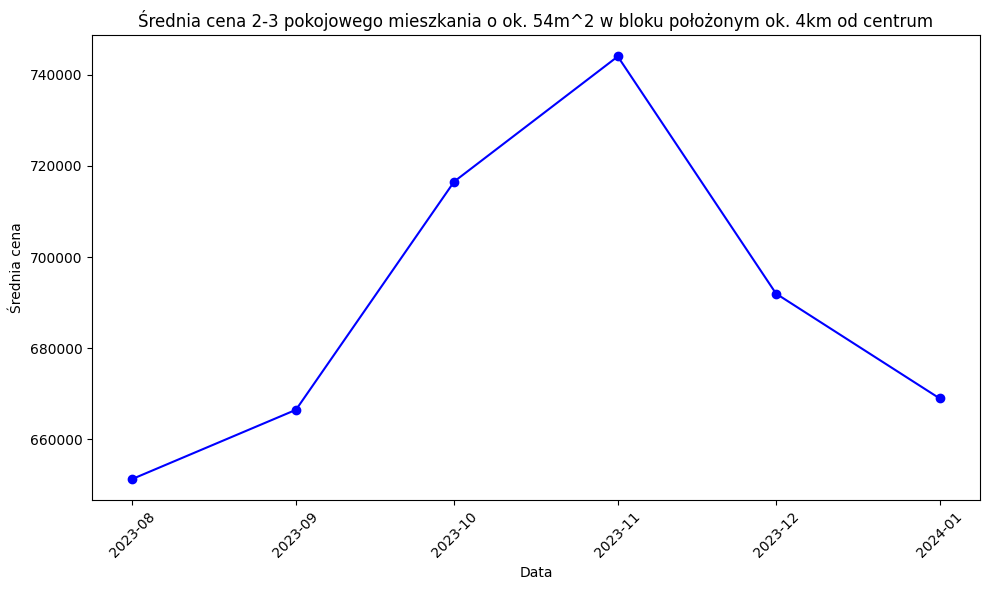

In [103]:
df = fetchPriceAndDate(condition='''WHERE squareMeters * 1.0 >= 53 AND squareMeters * 1.0 <=55 AND centreDistance * 1.0 >= 3.8
 AND centreDistance * 1.0 <= 4.1 AND rooms * 1 >= 2 AND rooms * 1 <=3 AND (type = "blockOfFlats" OR type = "apartmentBuilding")''')

mean_prices = getAvgSortedDates(df)
scatterPlot(mean_prices['date'], mean_prices['price'], "Średnia cena 2-3 pokojowego mieszkania o ok. 54m^2 w bloku położonym ok. 4km od centrum", "Data", "Średnia cena")


4.3.5 Porównanie cen z sierpnia 2023 z cenami ze stycznia 2024

Finalnie chciałem się dowiedzieć, które konkretnie mieszkania odpowiadają za taki wzrost średniej ceny. Z analizy wynika, że najbardziej wzrosły ceny w okolicy Starego Miasta. Natomiast miaszkania na obrzeżach mniej więcej utrzymały swoje ceny sprzed 6 miesięcy, a przynajmniej nie poszły tak bardzo w górę.

In [57]:
mapPrices(filename="august2023.html", condition="WHERE month * 1 = 8 AND year * 1 = 2023")
mapPrices(filename="january2024.html", condition="WHERE month * 1 = 1 AND year * 1 = 2024")

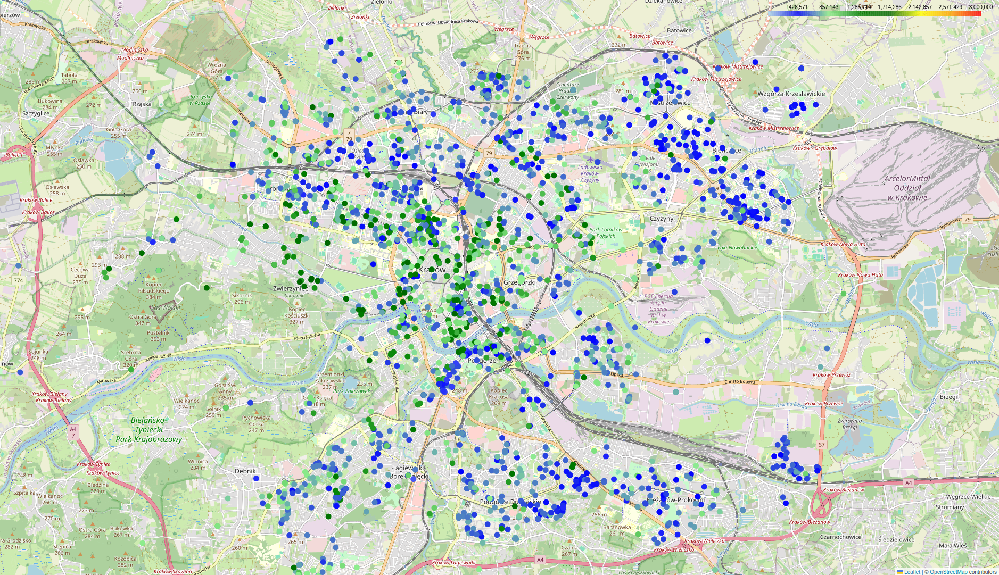

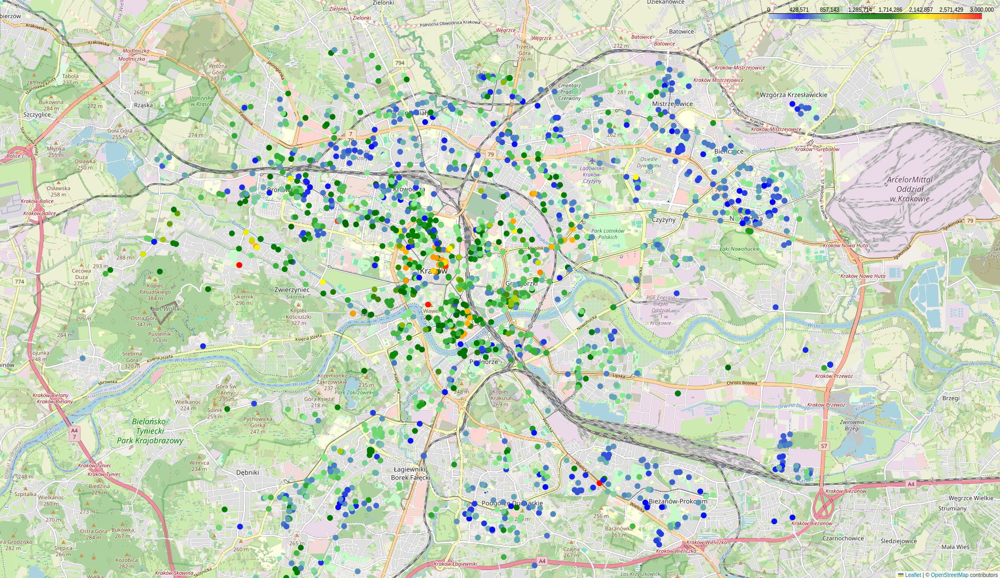

5. Wnioski

Na podstawie przeprowadzonej analizy można wysnuć kilka ciekawych wniosków:

- ceny mieszkań w Krakowie są najbardziej zależne od metrażu, liczby pokoi a także odległości od centrum miasta
- w III kwartale 2023 nastąpił znaczny wzrost średniej ceny zakupu mieszkania - od 750 tys. złotych aż do 950 tys. złotych
- ceny najpopularniejszych mieszkań w bloku po gwałtownym piku w sezonie zimowym powróciły niemal w całości do poprzedniej kwoty
- Najpopularniejsze w krakowie są o powierzchni 58 m^2
- Najwięcej ofert sprzedarzy dotyczyło mieszkań na parterze lub na pierwszym piętrze
- średnia liczba pokoi wacha się od 2 do 3 
- Najdroższymi dzielnicami są: Stare Miasto, Krowodrza, Grzegórzki i Podgórze
- Przez ostatnie sześć miesięcy najbardziej stabilną cenę utrzymały mieszkania na Bieżanowie i Nowej Hucie

Należy pamiętać, że są to dane zbierane z różnych stron internetowych przez kilka miesięcy i nie odzwierciedlają rzeczywistej wartości nieruchomości. Niewiemy także w jakim stanie technicznym są budynki. Natomiast jak wiadomo model statystyczny stanowi przybliżenie rzeczywistości, zatem myślę, że przeprowadzona analiza jest jak najbardziej wartościowa.

Realizacja projektu pozwoliła mi sie zapoznać z podstawowymi narzędziami statystycznymi w języku Python o raz pokazała jak bardzo przydatne jest korzystanie z lokalnej bazy danych. 